In [ ]:
# Install required packages.
!pip install -q torch-scatter -f https://pytorch-geometric.com/whl/torch-1.9.0+cu102.html
!pip install -q torch-sparse -f https://pytorch-geometric.com/whl/torch-1.9.0+cu102.html
!pip install -q torch-cluster -f https://pytorch-geometric.com/whl/torch-1.9.0+cu102.html
!pip install -q torch-geometric

     |████████████████████████████████| 2.6MB 7.9MB/s 
     |████████████████████████████████| 1.4MB 6.7MB/s 
     |████████████████████████████████| 931kB 7.1MB/s 
     |████████████████████████████████| 225kB 7.5MB/s 
     |████████████████████████████████| 235kB 44.7MB/s 
     |████████████████████████████████| 51kB 7.8MB/s 


In [ ]:
# !pip install pytorch3d>=0.4.0
!pip install "git+https://github.com/facebookresearch/pytorch3d.git"

  Cloning https://github.com/facebookresearch/pytorch3d.git to /tmp/pip-req-build-xsojslok
  Running command git clone -q https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-xsojslok
     |████████████████████████████████| 51kB 4.3MB/s 
     |████████████████████████████████| 645kB 16.5MB/s 
  Created wheel for pytorch3d: filename=pytorch3d-0.4.0-cp37-cp37m-linux_x86_64.whl size=24819016 sha256=7f1b6be729d4dc03cbb27fc800810fa2583481bb10242654a0c00ab7f9c8e795
  Stored in directory: /tmp/pip-ephem-wheel-cache-bc421oiy/wheels/43/ba/81/3e4acb84fba48ba1b8264b1e4bba60662d098cb0c7cf486723
  Created wheel for fvcore: filename=fvcore-0.1.5.post20210624-cp37-none-any.whl size=60611 sha256=1d98ba8364bcdb7747d3f58f700b08752d8aa51d25cdf38ba78e6f8d0d2eff1d
  Stored in directory: /root/.cache/pip/wheels/6d/3d/8b/911fda7dc70c40197710f00c0e0b6d0d11c4d0bfb620567894
Successfully built pytorch3d fvcore
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successf

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable

from torchsummary import summary

from torch_geometric.datasets import ModelNet, ShapeNet
from torch_geometric.transforms import Compose, FixedPoints, SamplePoints, NormalizeScale
from torch_geometric.data import DataLoader

import pytorch3d
from pytorch3d.loss.chamfer import chamfer_distance

import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import time

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")    
torch.__version__, device

('1.9.0+cu102', device(type='cuda'))

In [ ]:
def visualize_mesh(pos, face):
    # from the tutorial https://colab.research.google.com/drive/1D45E5bUK3gQ40YpZo65ozs7hg5l-eo_U?usp=sharing#scrollTo=SvsEAR28LUI7
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.axes.xaxis.set_ticklabels([])
    ax.axes.yaxis.set_ticklabels([])
    ax.axes.zaxis.set_ticklabels([])
    ax.plot_trisurf(pos[:, 0], pos[:, 1], pos[:, 2], triangles=face.t(), antialiased=False)
    plt.show()


def visualize_points(points, ax=None, show_grid=False, is_shapenet=False):
    fig = plt.figure()
    if ax is None:
        ax = fig.gca(projection='3d')
    ax.patch.set_alpha(0)
    ax.view_init(elev=10., azim=240.)
    ax.grid(show_grid)
    if is_shapenet:
      ax.scatter(points[:,0], points[:,2], points[:,1], c=points[:,2], cmap='plasma', s=10)
    else:
      ax.scatter(points[:,0], points[:,1], points[:,2], c=points[:,1], cmap='plasma', s=10)
    

def visualize_real_and_generated_samples(samples, show_grid=False, is_shapenet=False):
    fig = plt.figure(figsize=(16, 8))
    for i, sample in enumerate(samples):
        ax = fig.add_subplot(1, 2, i+1, projection='3d')
        visualize_points(sample, ax, show_grid, is_shapenet)

Extracting ./shapenetcore_partanno_segmentation_benchmark_v0_normal.zip
Processing...
Done!
ShapeNet(3054, categories=['Chair'])
Data(category=[1], pos=[2736, 3], x=[2736, 3], y=[2736])
Data(category=[1], pos=[2647, 3], x=[2647, 3], y=[2647])


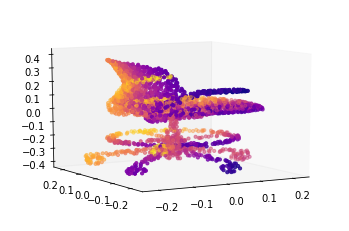

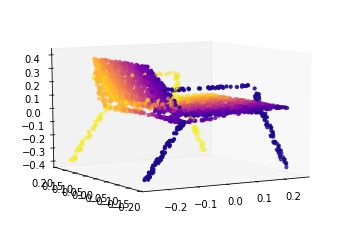

In [ ]:
#dataset = ModelNet(root='E:\data\modelnet40_data', name='40')
#shape_label = 0
#dataset = CustomModelNet(root='.', name='40', pre_filter_target=lambda y: y == shape_label)
shape_name = 'Chair'
dataset = ShapeNet(root='.', categories=shape_name)

print(dataset)

data = dataset[0]
print(data)
# print(type(data.face), data.face)
# visualize_mesh(data.pos, data.face) # for ModelNet
visualize_points(data.pos, is_shapenet=True)


data = dataset[4]
print(data)
# visualize_mesh(data.pos, data.face) # for ModelNet
visualize_points(data.pos, is_shapenet=True)

In [ ]:
torch.manual_seed(11)

n_points = 2048 # number of points to sample
dataset.transform = FixedPoints(num=n_points) # samples points from a point cloud

# for ModelNet:
# SamplePoints samples points from a mesh
# dataset.transform = Compose([SamplePoints(num=n_points), NormalizeScale()])

In [ ]:
# shape_label = 0
# single_class_data = dataset[dataset.data.y==shape_label]
single_class_data = dataset
n_shapes = len(single_class_data)
n_shapes

3054

## Metrics

### Coverage and Fidelity

In [ ]:
def coverage(real_clouds, gen_clouds, distance_fn):    
    matches = [ torch.argmin(torch.as_tensor([distance_fn(a, b) for b in real_clouds])) for a in gen_clouds ]
    score = len(torch.unique(matches)) / len(gen_clouds)
    return score


def fidelity(real_clouds, gen_clouds, distance_fn):
    distances = [ [distance_fn(a, b) for b in gen_clouds] for a in real_clouds ]
    distances = torch.as_tensor(distances)

    min_distances = distances.min(dim=-1)

    score = torch.mean(min_distances)
    
    return score

## The Chamfer loss

(based on the Chamfer pseudo-distance)

In [ ]:
class ChamferLoss(nn.Module):
    def __init__(self, point_reduction='sum'):
        super(ChamferLoss, self).__init__()
        self.point_reduction = point_reduction

    def forward(self, x, y):
        # https://pytorch3d.readthedocs.io/en/latest/_modules/pytorch3d/loss/chamfer.html
        chamfer_dist, chamfer_normals = chamfer_distance(x, y, point_reduction=self.point_reduction)
        return chamfer_dist

## The Autoencoder (AE)

In [ ]:
class Autoencoder(nn.Module):
  def __init__(self, encoder_in_ch=3, encoder_out_ch=128, n_points=2048):        
        super(Autoencoder, self).__init__()
        self.n_points = n_points

        self.encoder = nn.Sequential(
            nn.Conv1d(encoder_in_ch, 64, 1, 1), nn.BatchNorm1d(64), nn.ReLU(True), 
            nn.Conv1d(64, 128, 1, 1), nn.BatchNorm1d(128), nn.ReLU(True), 
            nn.Conv1d(128, 128, 1, 1), nn.BatchNorm1d(128), nn.ReLU(True), 
            nn.Conv1d(128, 256, 1, 1), nn.BatchNorm1d(256), nn.ReLU(True), 
            nn.Conv1d(256, encoder_out_ch, 1, 1), nn.BatchNorm1d(encoder_out_ch), nn.ReLU(True), 
        )

        # outputs (batch_size x encoder_out_ch x n_points)
        # we then maxpool the output in the forward method, 
        # so the input to the decoder becomes (batch_size x encoder_out_ch)
        
        self.decoder = nn.Sequential(
            nn.Linear(encoder_out_ch, 256), nn.ReLU(True),
            nn.Linear(256, 256), nn.ReLU(True),
            nn.Linear(256, 3*n_points)
        )  
    
  def forward(self, x):
      x = self.encoder(x)
      x, _ = torch.max(x, dim=-1)
      x = self.decoder(x) 
      return x.view(x.size(0), 3, -1)

In [ ]:
ae_model = Autoencoder(encoder_in_ch=3, encoder_out_ch=128, n_points=2048).to(device)
summary(ae_model, (3, 2048))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv1d-1             [-1, 64, 2048]             256
       BatchNorm1d-2             [-1, 64, 2048]             128
              ReLU-3             [-1, 64, 2048]               0
            Conv1d-4            [-1, 128, 2048]           8,320
       BatchNorm1d-5            [-1, 128, 2048]             256
              ReLU-6            [-1, 128, 2048]               0
            Conv1d-7            [-1, 128, 2048]          16,512
       BatchNorm1d-8            [-1, 128, 2048]             256
              ReLU-9            [-1, 128, 2048]               0
           Conv1d-10            [-1, 256, 2048]          33,024
      BatchNorm1d-11            [-1, 256, 2048]             512
             ReLU-12            [-1, 256, 2048]               0
           Conv1d-13            [-1, 128, 2048]          32,896
      BatchNorm1d-14            [-1, 12

## Optimize the Autoencoder

### Optimization setup

In [ ]:
# hyperparameters:
lr = 5*1e-4

# the Adam optimizer:
optimizer = optim.Adam(params=ae_model.parameters(), lr=lr)

# the Chamfer loss:
criterion = ChamferLoss()

## Create a dataloader for our single class dataset

In [ ]:
batch_size = 50
dataloader = DataLoader(dataset=single_class_data, 
                        batch_size=batch_size, 
                        shuffle=True,
                        drop_last=True)

print('Batch size: ', batch_size)
print('Number of batches:', len(dataloader))

Batch size:  50
Number of batches: 61


## Training loop

In [ ]:
epochs = 500
print_period = 20

losses = []

for i in range(epochs):
    t0 = time.time()
    
    for batch_idx, batch_data in enumerate(dataloader):
        print(batch_idx, end='\r')
        batch_t0 = time.time()
        batch_size = batch_data.pos.shape[0] // n_points
        
        x = batch_data.pos.reshape(batch_size, n_points, 3).transpose(2, 1).to(device)

        # compute the reconstructed samples:
        x_hat = ae_model(x)
       
        # compute the Chamfer loss
        # (transpose the inputs so that the shape is [batch_size x n_points x 3]):
        loss = criterion(x.transpose(2, 1), x_hat.transpose(2, 1))
         
        # compute the gradient of the loss wrt the AE parameters:
        optimizer.zero_grad()
        loss.backward()
        
        # update the AE parameters:
        optimizer.step()
        losses.append(loss.item())
        
        if batch_idx % print_period == 0:
            print('ETA: %.5f, epoch: %d/%d, batch: %d/%d, loss: %.3f'
              % (time.time() - batch_t0, i+1, epochs, batch_idx, len(dataloader), torch.mean(torch.FloatTensor(losses)))
            )
            
    print('ETA: %.5f' % (time.time() - t0), end='\n\n')   

ETA: 0.51833, epoch: 1/500, batch: 0/61, loss: 126.752
ETA: 0.05127, epoch: 1/500, batch: 20/61, loss: 16.833
ETA: 0.05081, epoch: 1/500, batch: 40/61, loss: 11.526
ETA: 0.05203, epoch: 1/500, batch: 60/61, loss: 9.480
ETA: 4.88410

ETA: 0.04958, epoch: 2/500, batch: 0/61, loss: 9.391
ETA: 0.05195, epoch: 2/500, batch: 20/61, loss: 8.154
ETA: 0.05199, epoch: 2/500, batch: 40/61, loss: 7.299
ETA: 0.05247, epoch: 2/500, batch: 60/61, loss: 6.674
ETA: 4.06059

ETA: 0.05148, epoch: 3/500, batch: 0/61, loss: 6.646
ETA: 0.05179, epoch: 3/500, batch: 20/61, loss: 6.183
ETA: 0.05273, epoch: 3/500, batch: 40/61, loss: 5.827
ETA: 0.05216, epoch: 3/500, batch: 60/61, loss: 5.527
ETA: 4.08679

ETA: 0.05186, epoch: 4/500, batch: 0/61, loss: 5.517
ETA: 0.05245, epoch: 4/500, batch: 20/61, loss: 5.277
ETA: 0.05177, epoch: 4/500, batch: 40/61, loss: 5.062
ETA: 0.05231, epoch: 4/500, batch: 60/61, loss: 4.865
ETA: 4.07142

ETA: 0.05231, epoch: 5/500, batch: 0/61, loss: 4.857
ETA: 0.05287, epoch: 5/500,

## Save the model

In [ ]:
torch.save(
      ae_model.state_dict(),
      shape_name+'_ae_model.tar'
    )

In [ ]:
loaded_model = torch.load(shape_name+'_ae_model.tar', map_location=device)
loaded_model.keys()

odict_keys(['encoder.0.weight', 'encoder.0.bias', 'encoder.1.weight', 'encoder.1.bias', 'encoder.1.running_mean', 'encoder.1.running_var', 'encoder.1.num_batches_tracked', 'encoder.3.weight', 'encoder.3.bias', 'encoder.4.weight', 'encoder.4.bias', 'encoder.4.running_mean', 'encoder.4.running_var', 'encoder.4.num_batches_tracked', 'encoder.6.weight', 'encoder.6.bias', 'encoder.7.weight', 'encoder.7.bias', 'encoder.7.running_mean', 'encoder.7.running_var', 'encoder.7.num_batches_tracked', 'encoder.9.weight', 'encoder.9.bias', 'encoder.10.weight', 'encoder.10.bias', 'encoder.10.running_mean', 'encoder.10.running_var', 'encoder.10.num_batches_tracked', 'encoder.12.weight', 'encoder.12.bias', 'encoder.13.weight', 'encoder.13.bias', 'encoder.13.running_mean', 'encoder.13.running_var', 'encoder.13.num_batches_tracked', 'decoder.0.weight', 'decoder.0.bias', 'decoder.2.weight', 'decoder.2.bias', 'decoder.4.weight', 'decoder.4.bias'])

## Plot the loss
 (the Chamfer pseudo-distance between the input and reconstructed point clouds)

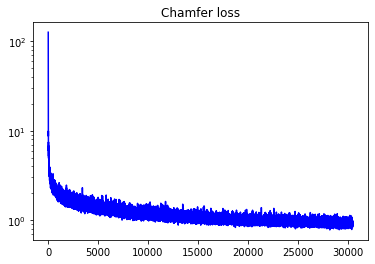

In [ ]:
plt.plot(range(0, len(losses)), losses, 'b-')
plt.gca().patch.set_alpha(0)
plt.title('Chamfer loss')
plt.yscale('log')
# plt.legend()
plt.show()

## Compute and visualize reconstructions

(50, 3, 2048)
(50, 3, 2048)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


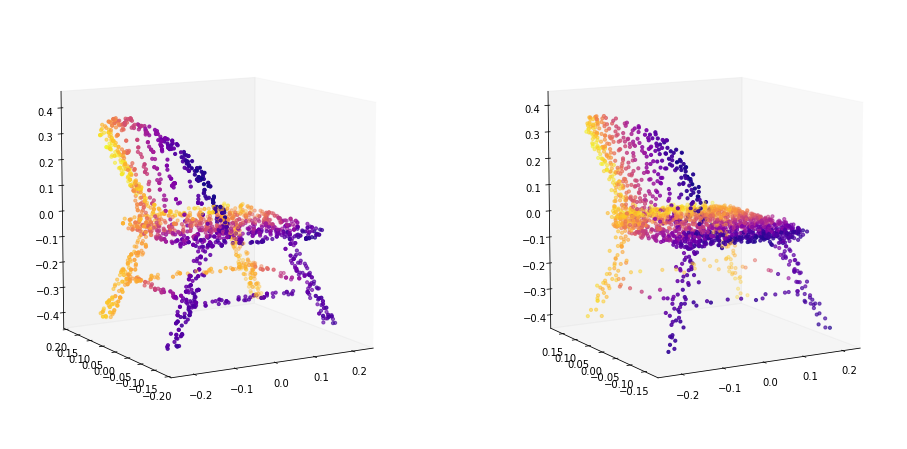

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

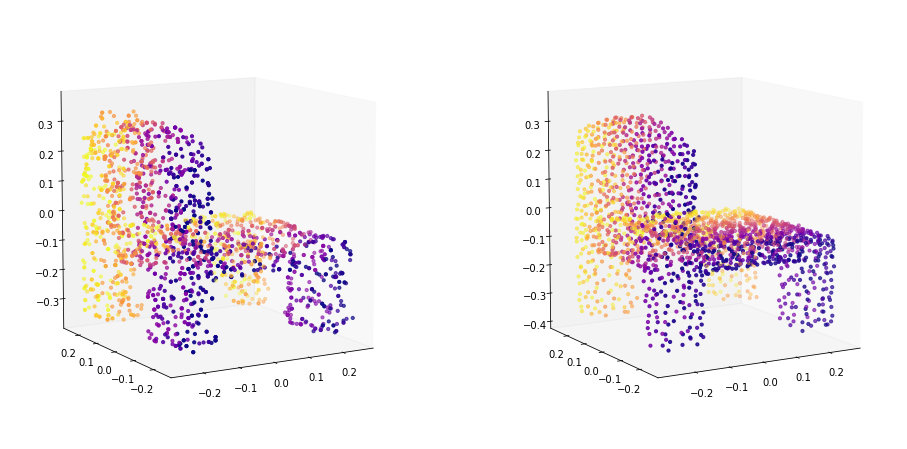

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

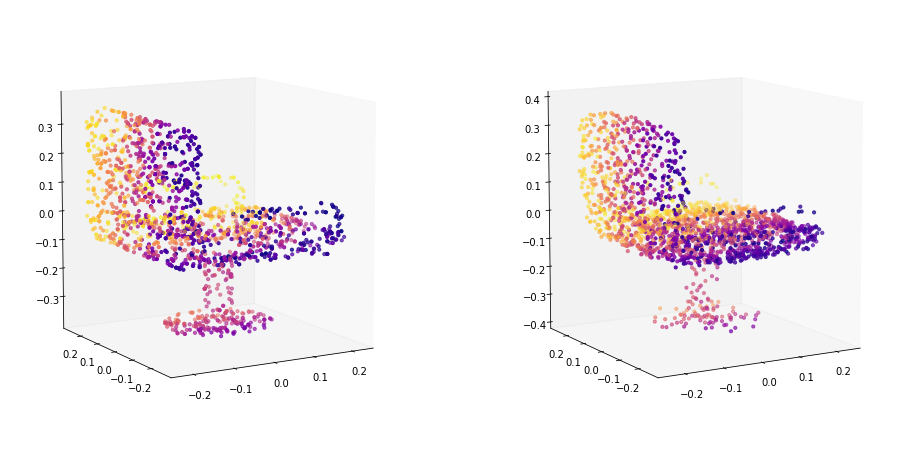

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

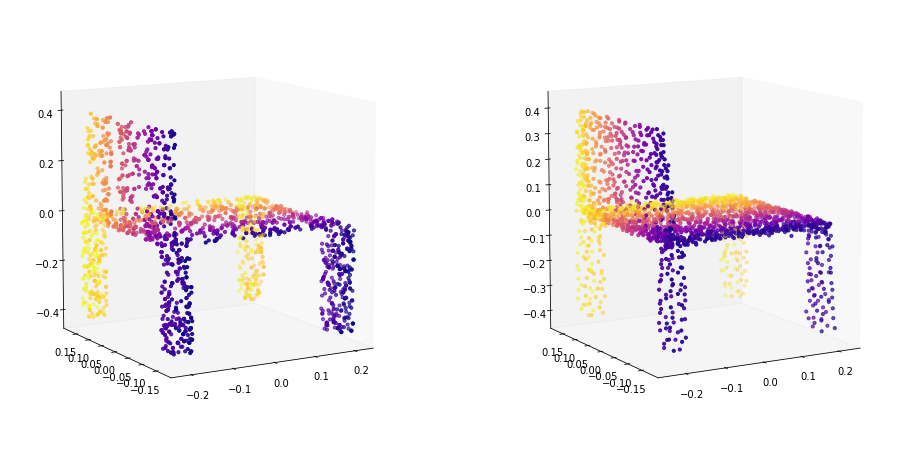

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

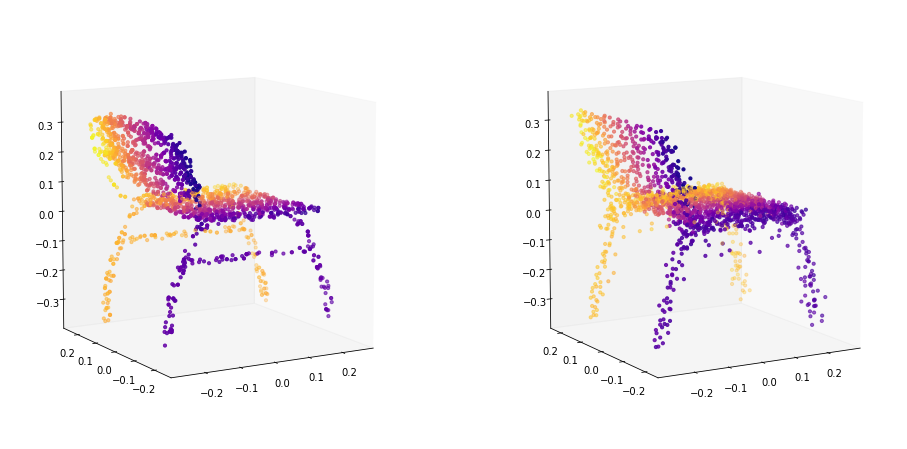

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

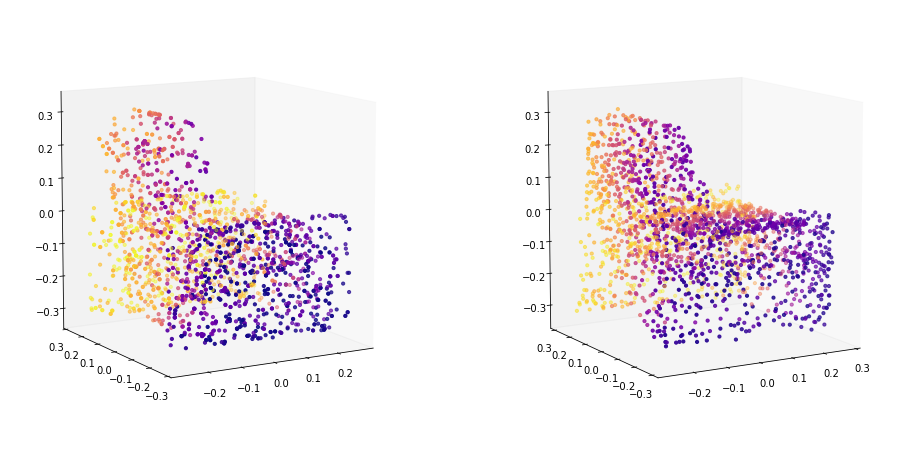

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

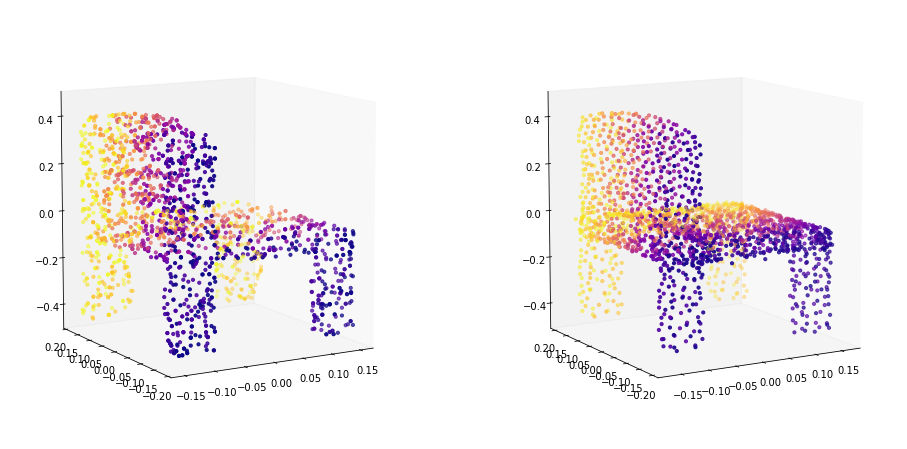

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

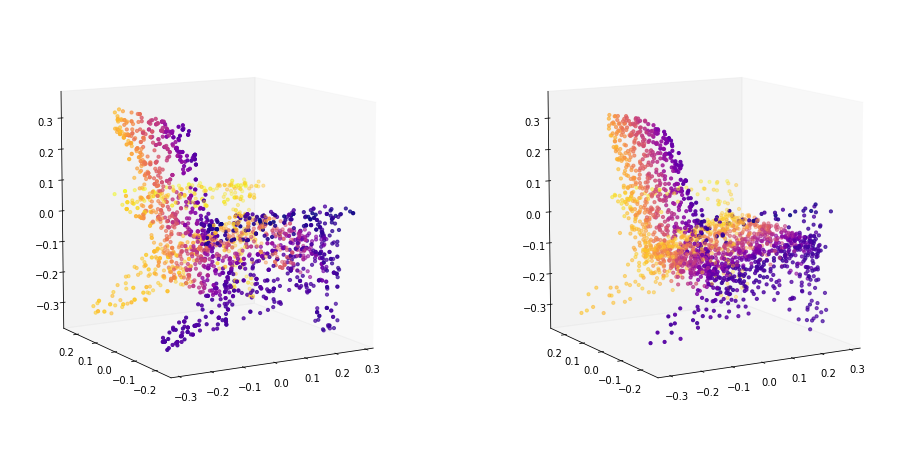

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

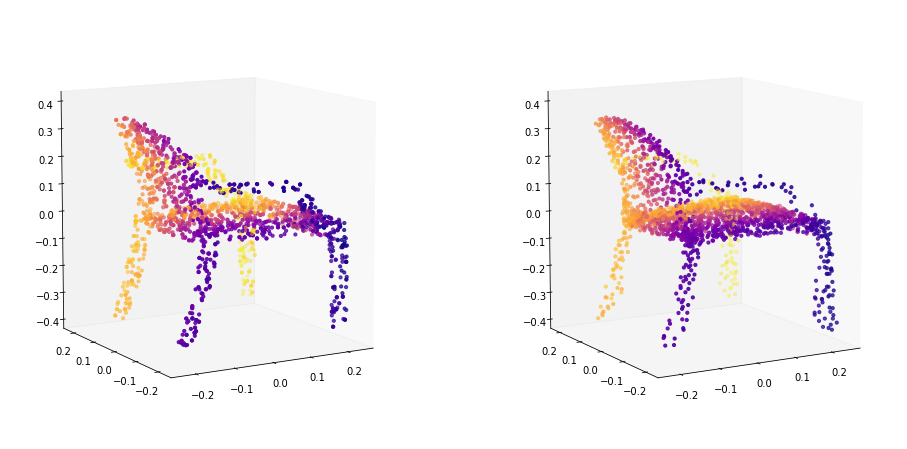

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

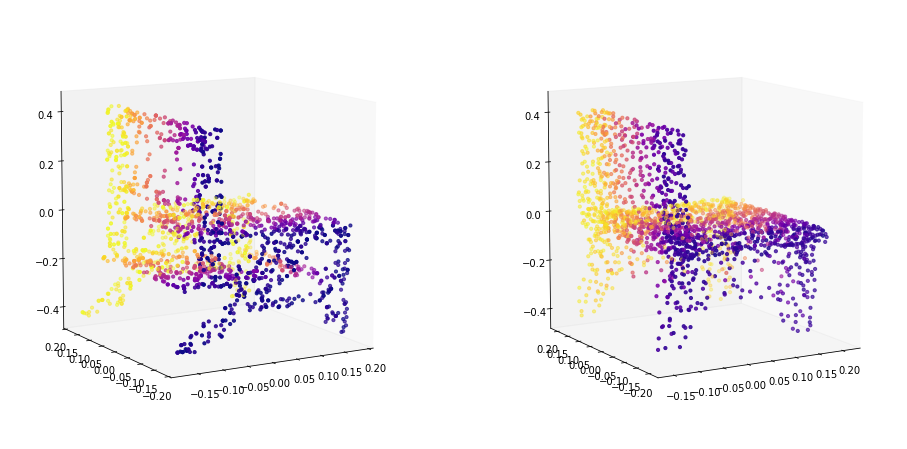

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

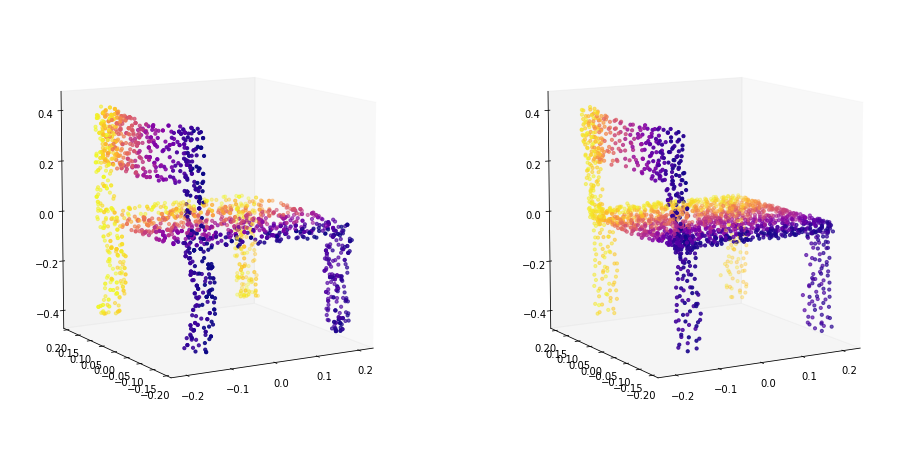

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

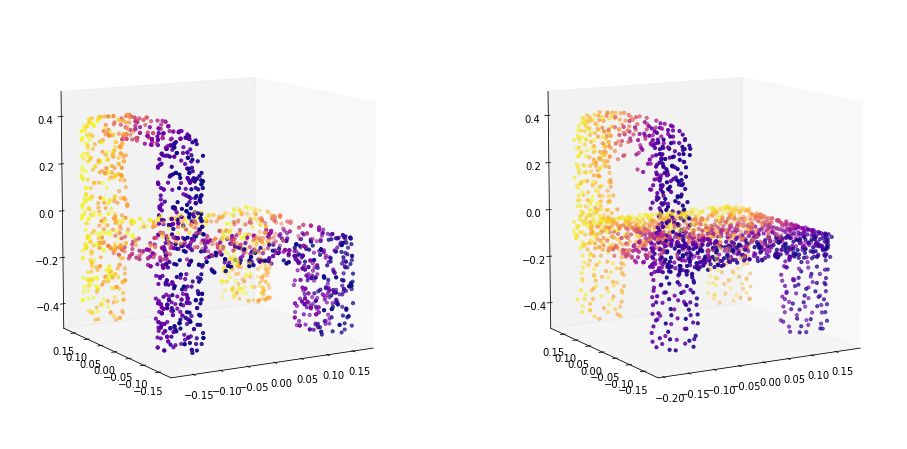

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

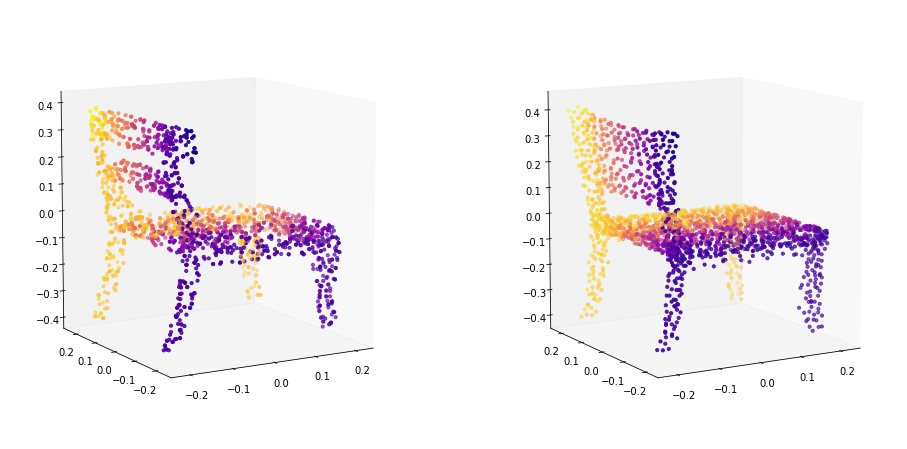

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

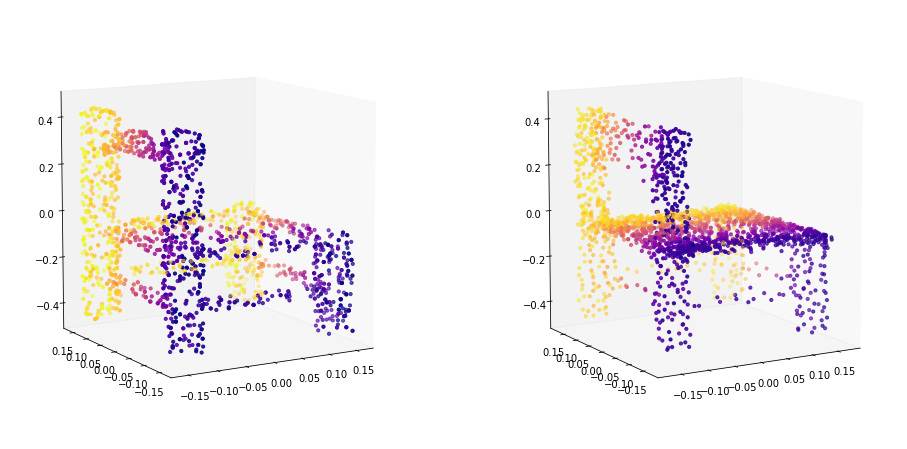

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

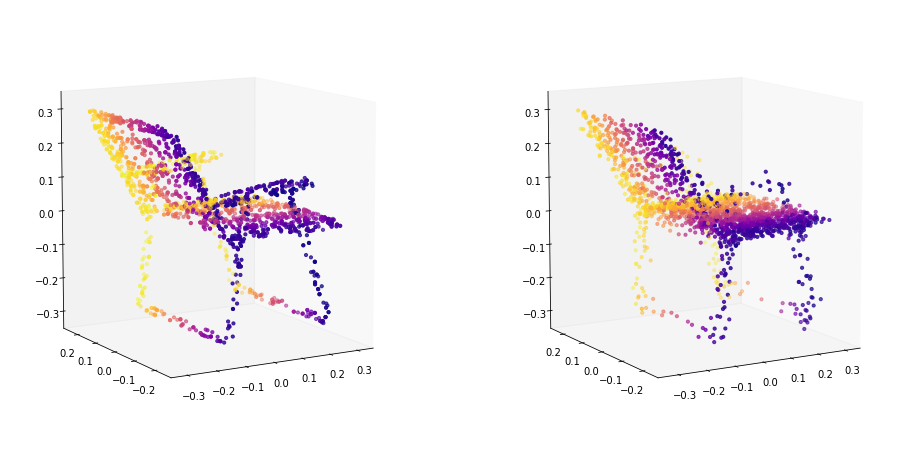

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

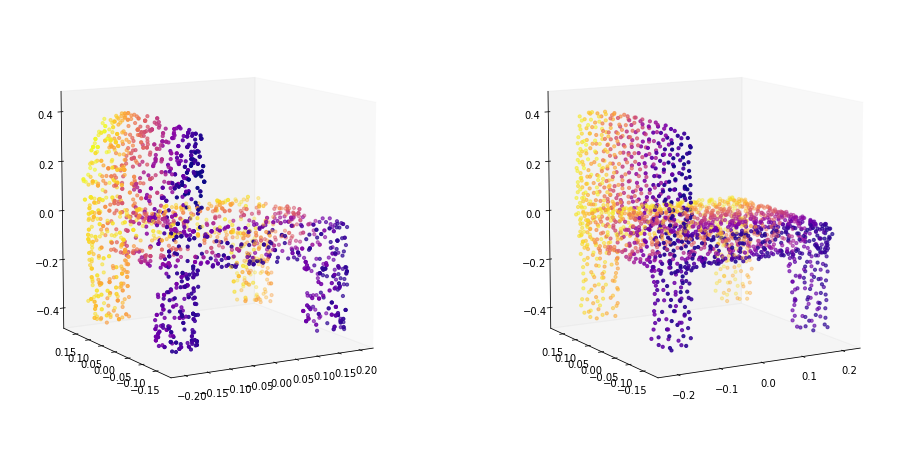

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

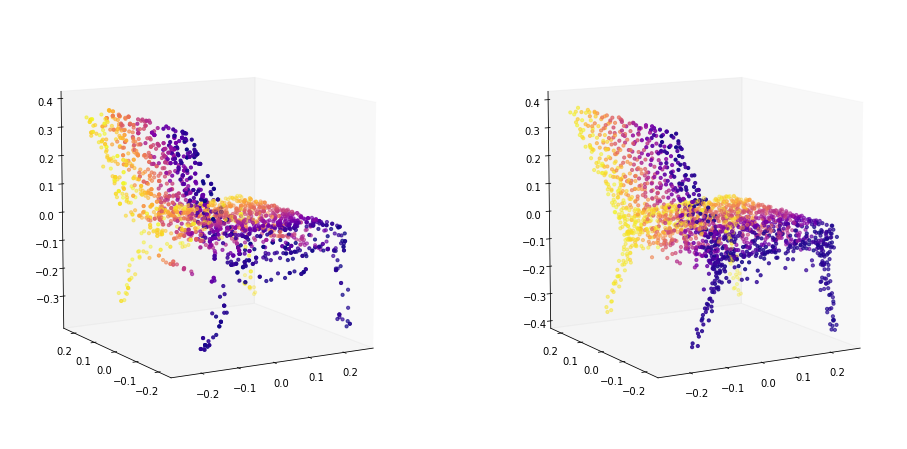

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

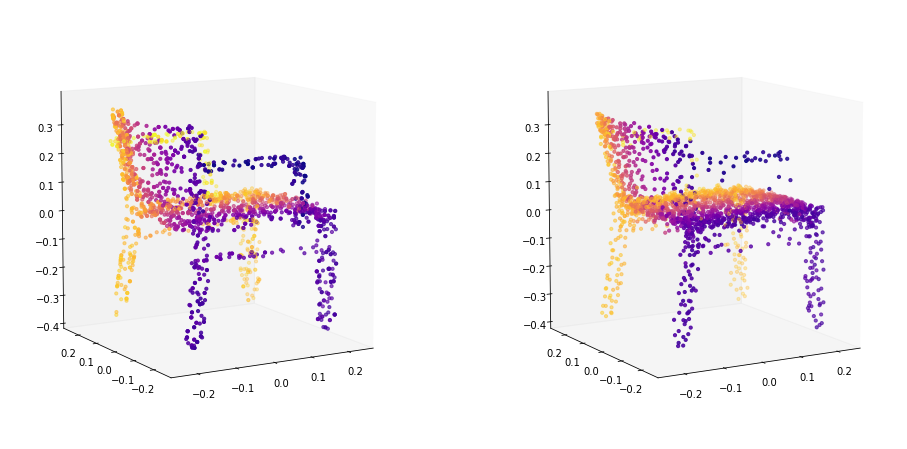

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

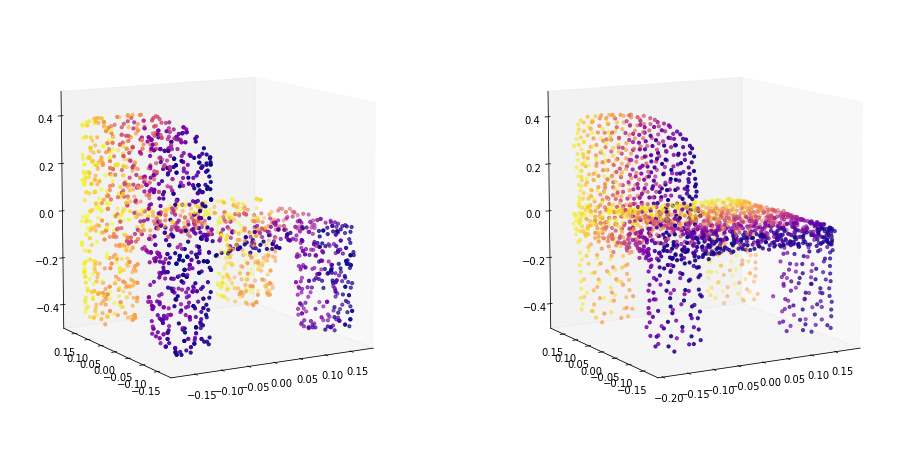

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

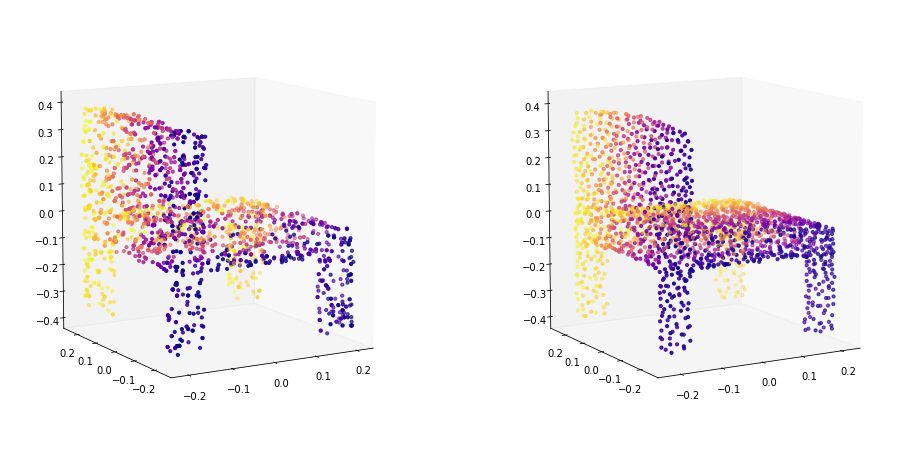

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

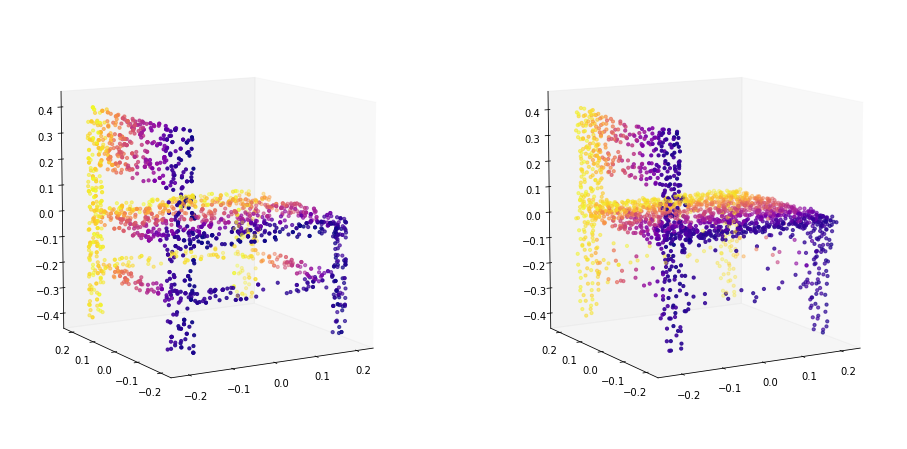

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

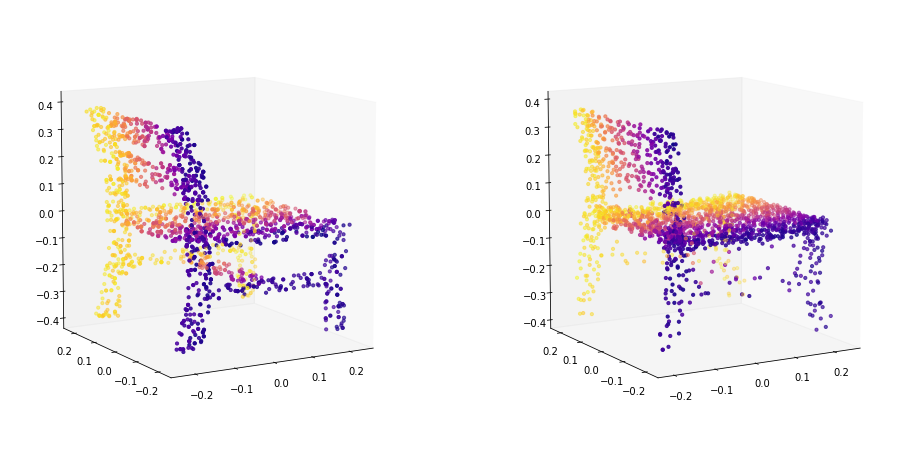

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

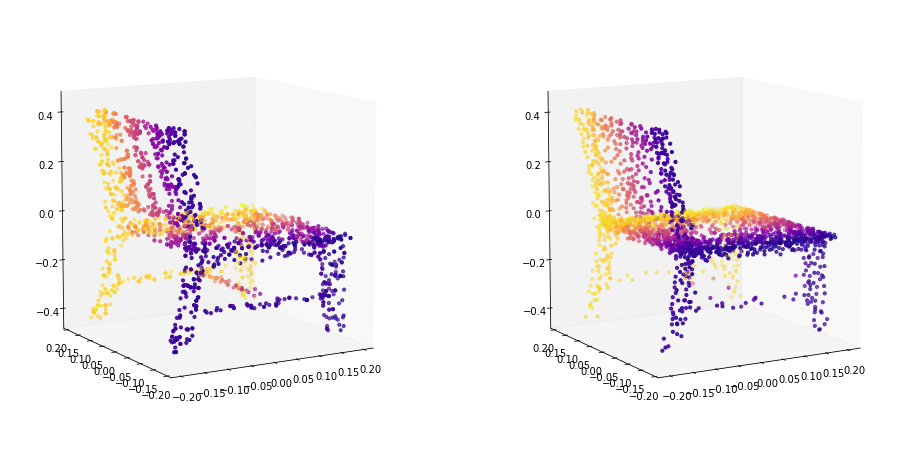

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

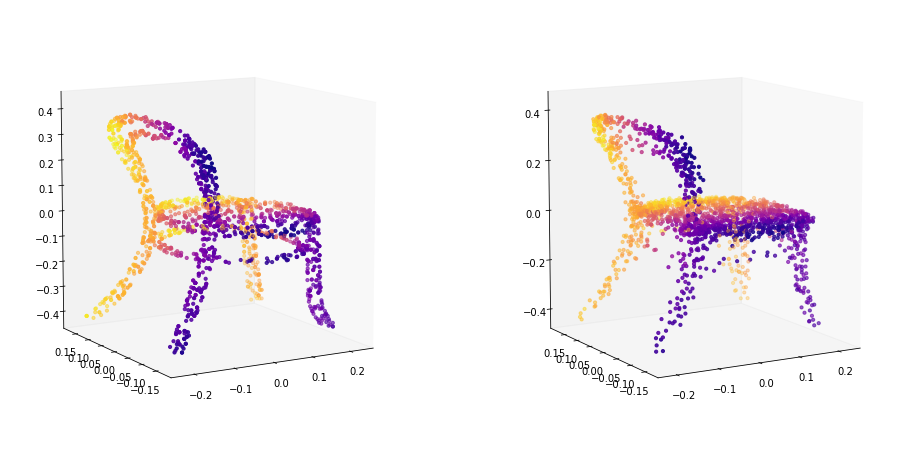

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

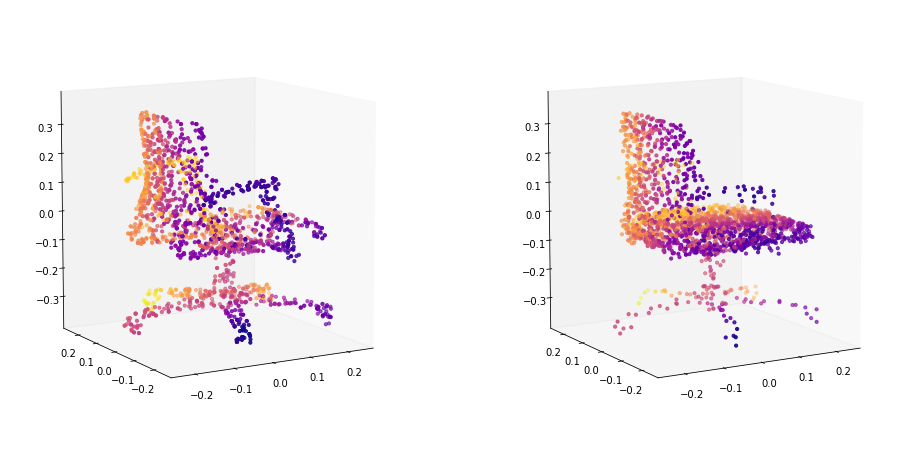

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

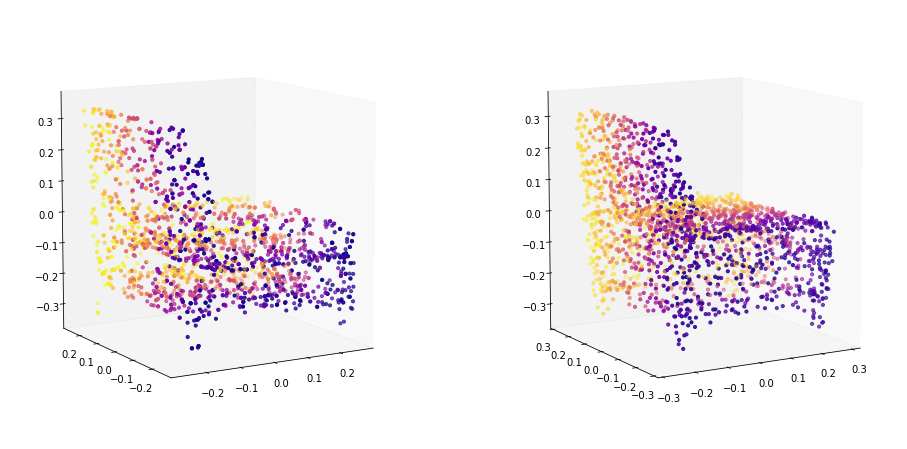

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

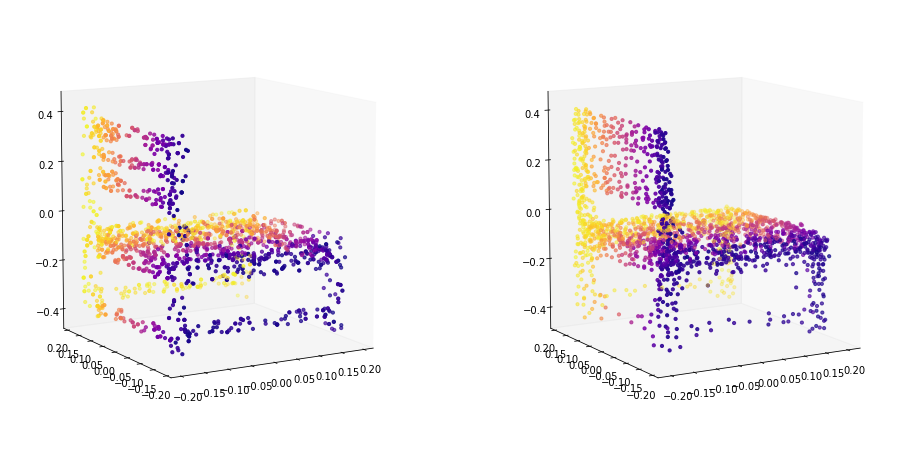

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

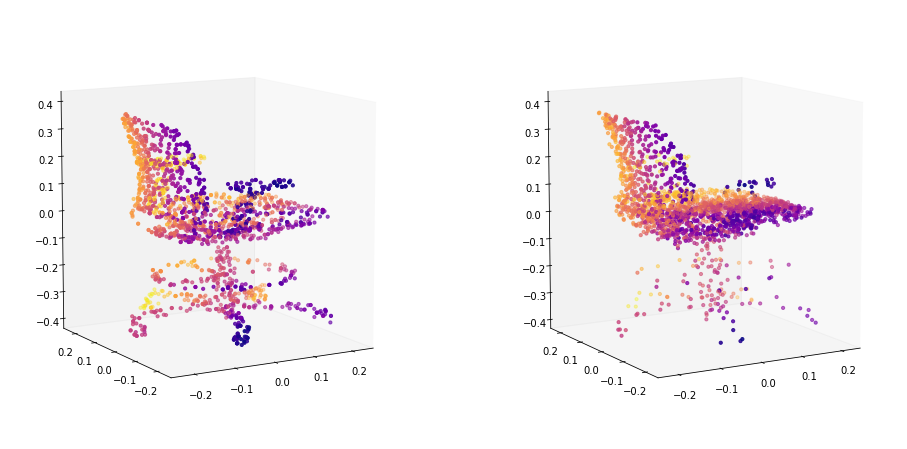

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

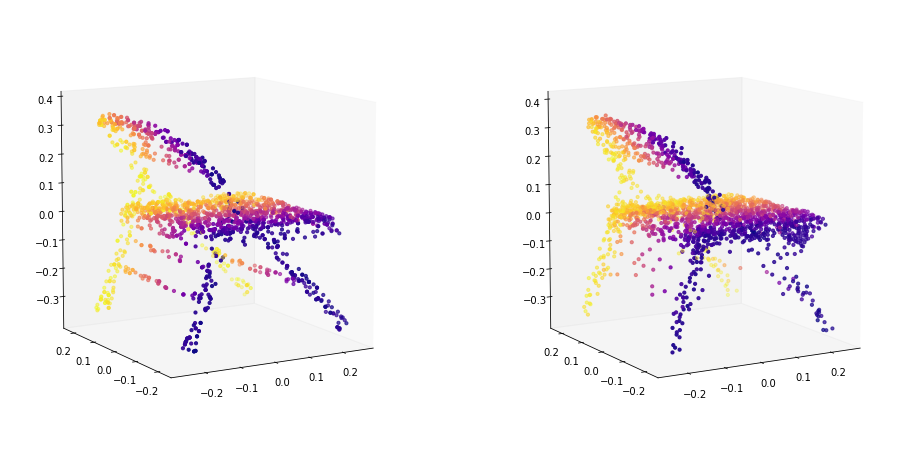

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

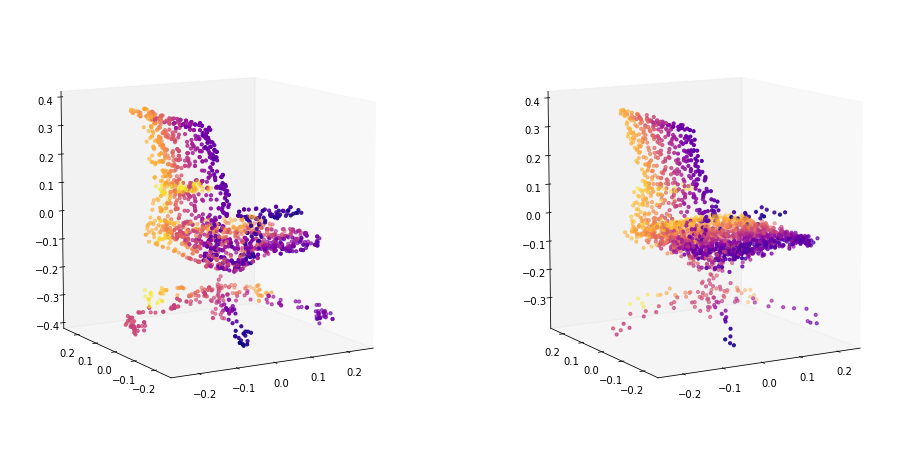

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

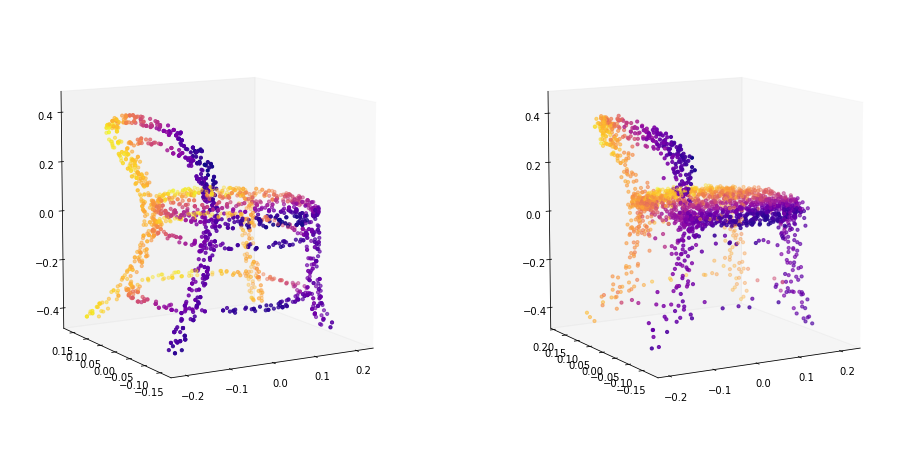

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

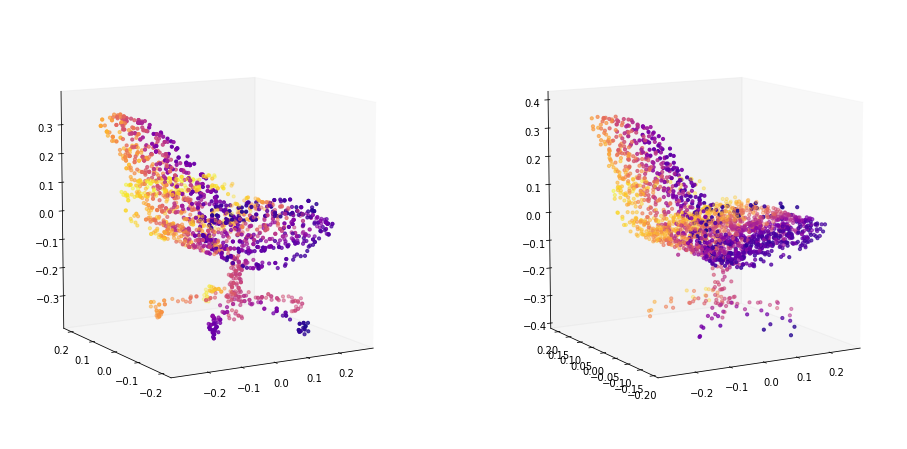

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

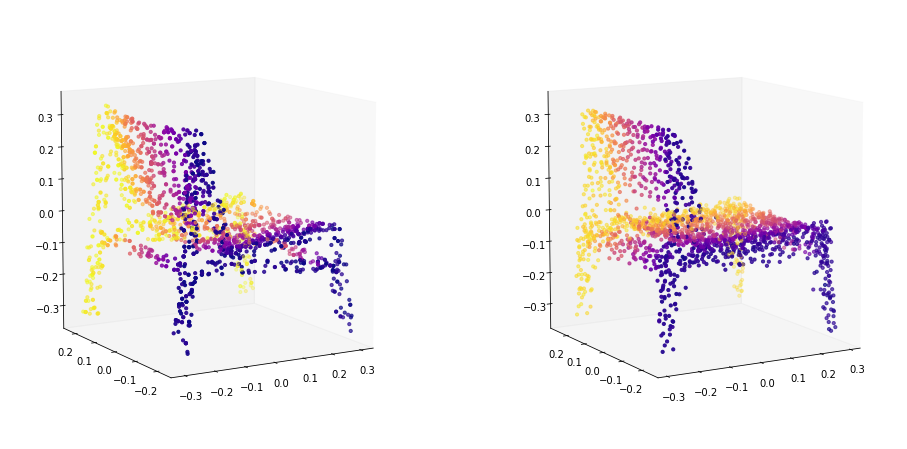

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

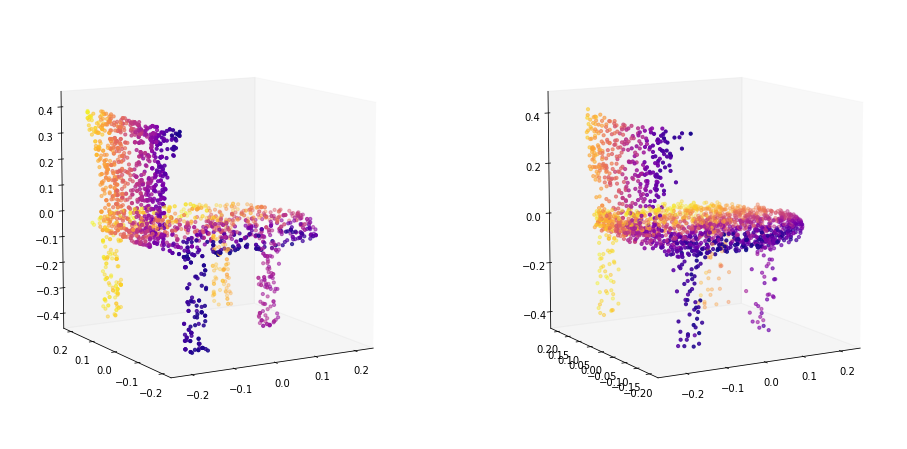

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

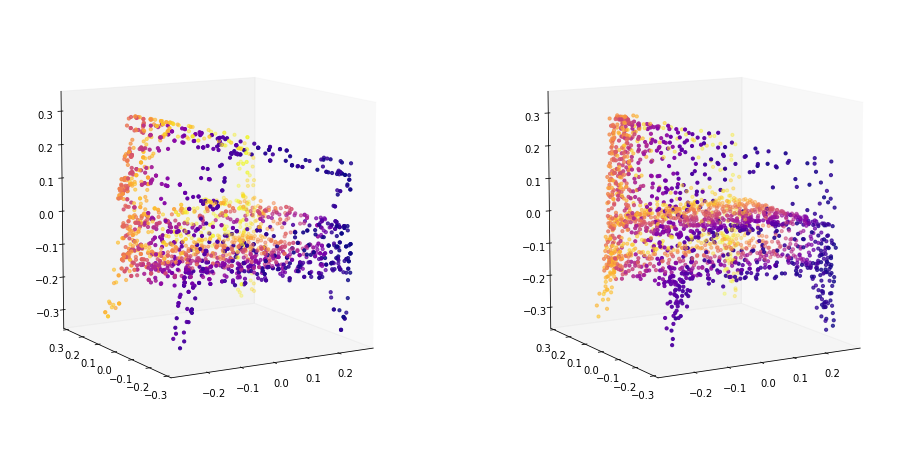

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

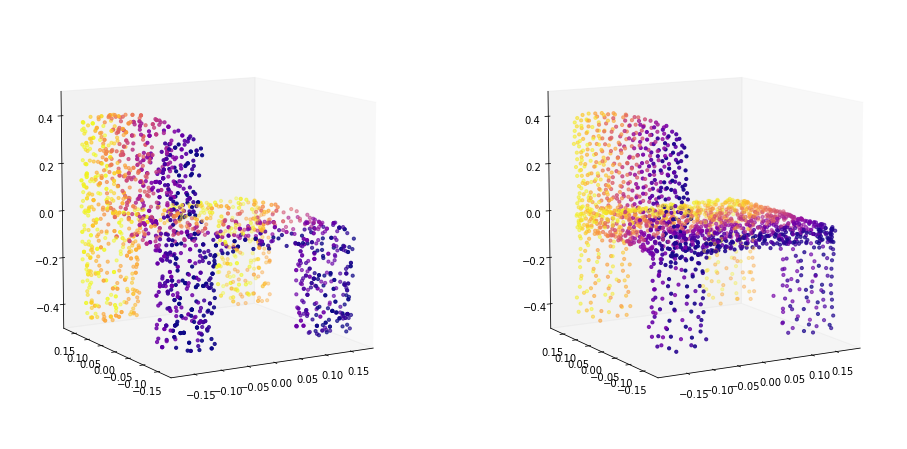

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

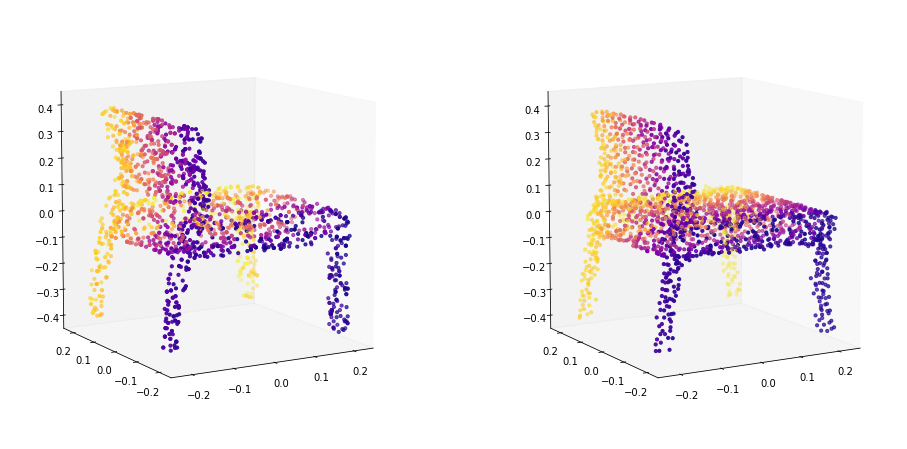

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

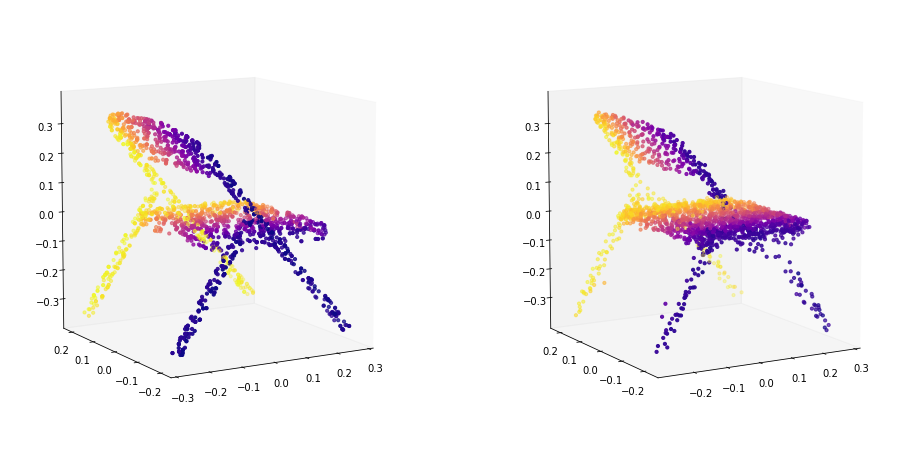

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

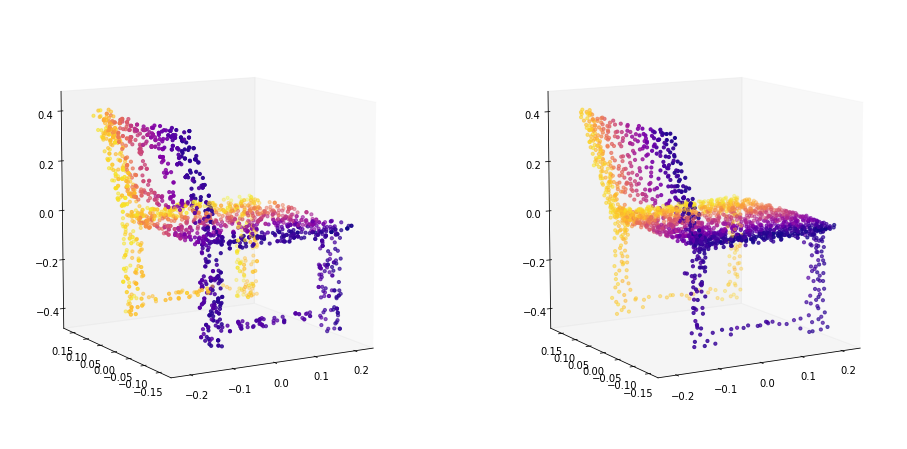

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

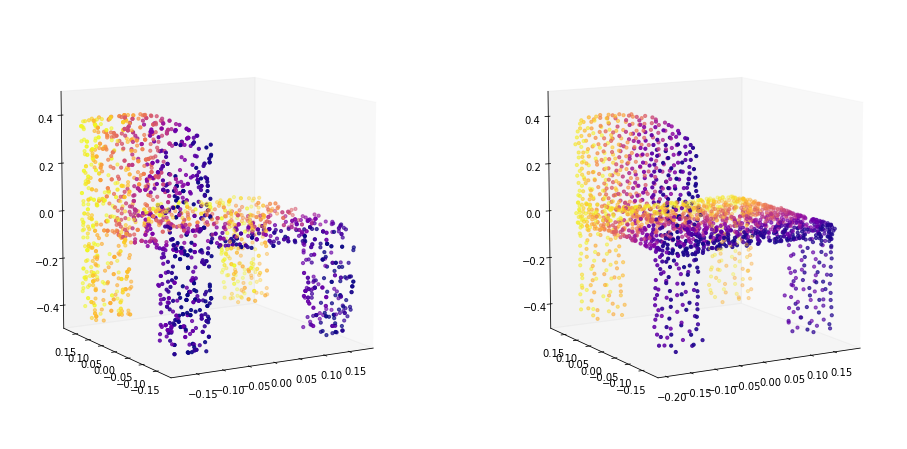

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

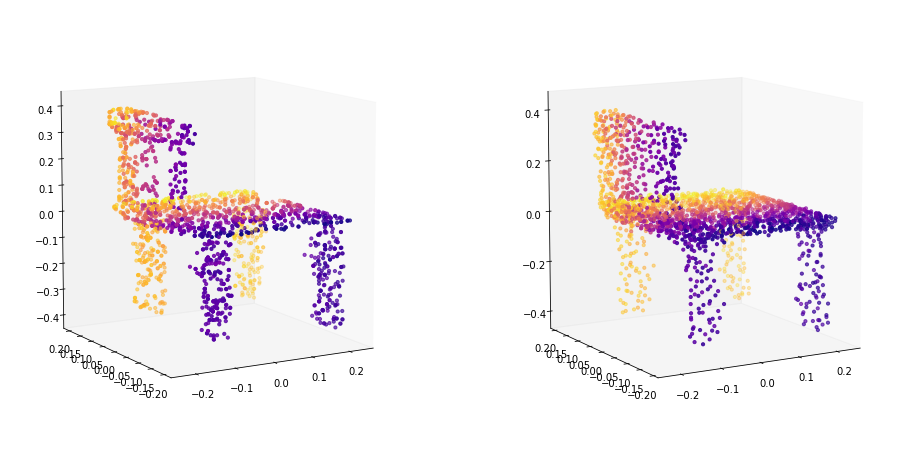

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

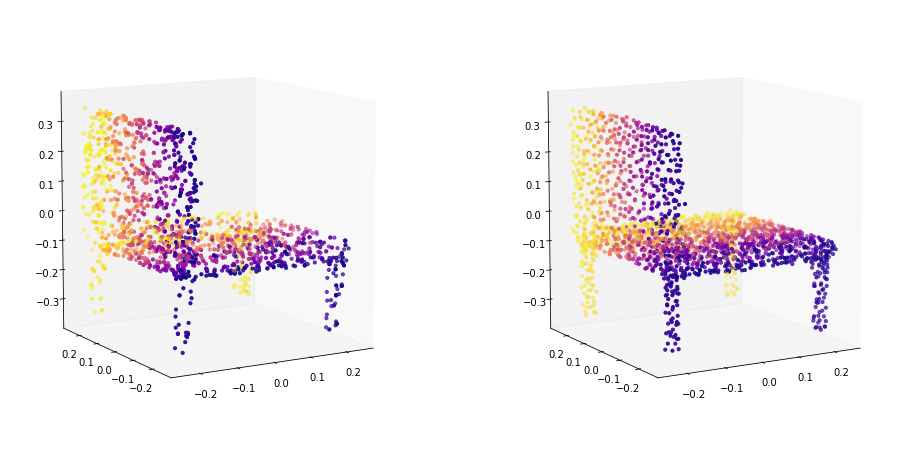

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

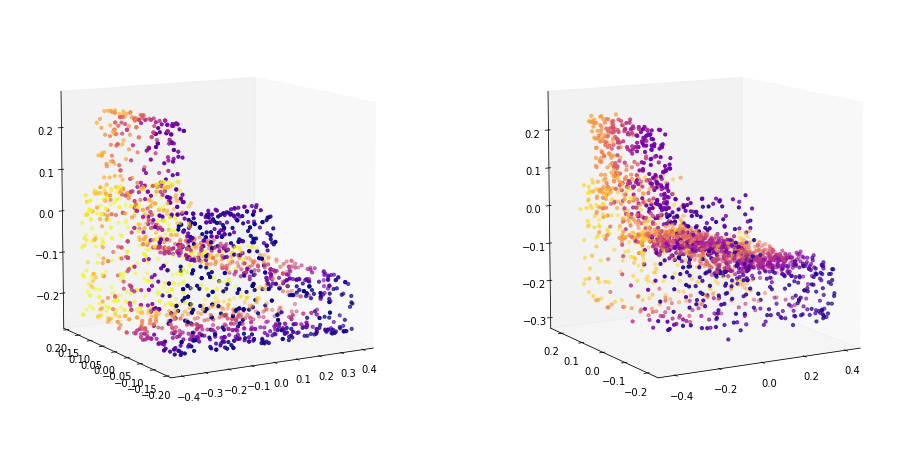

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

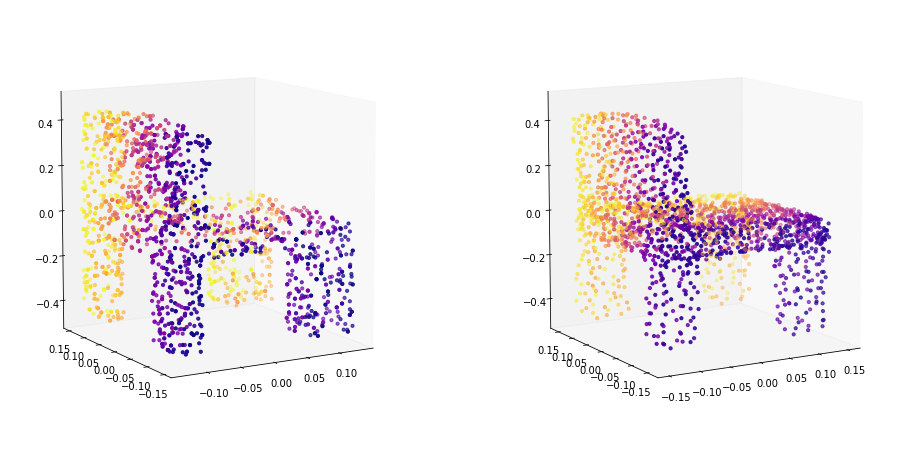

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

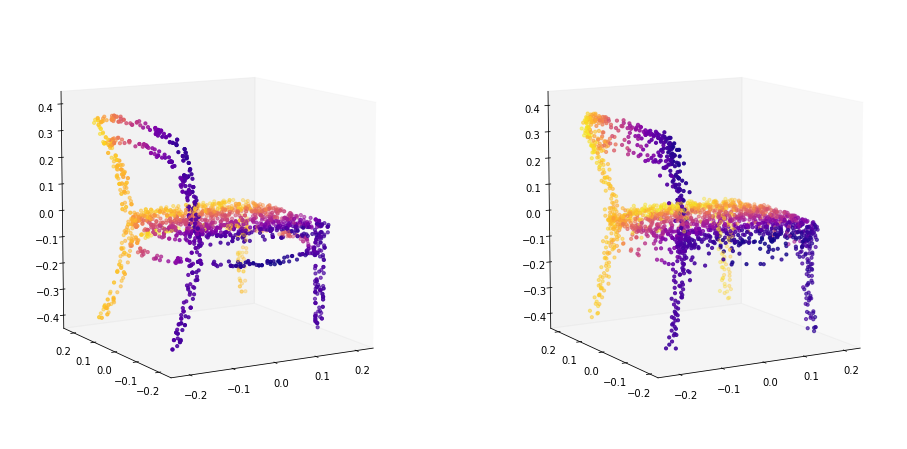

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

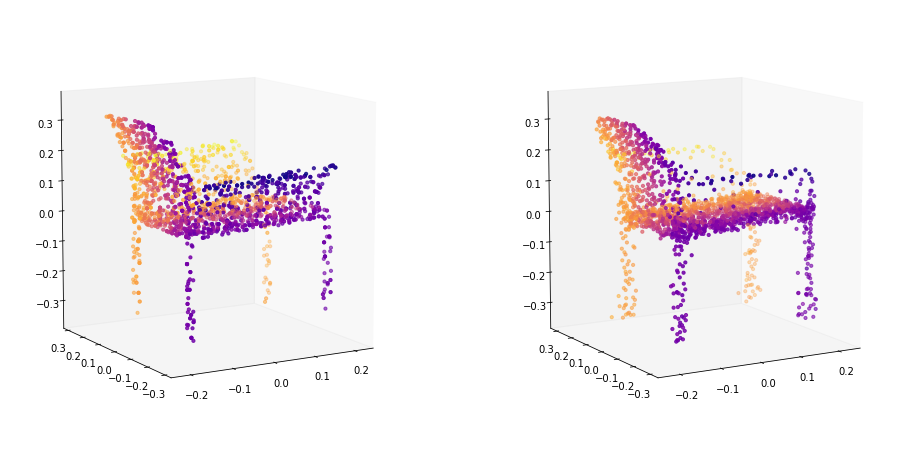

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

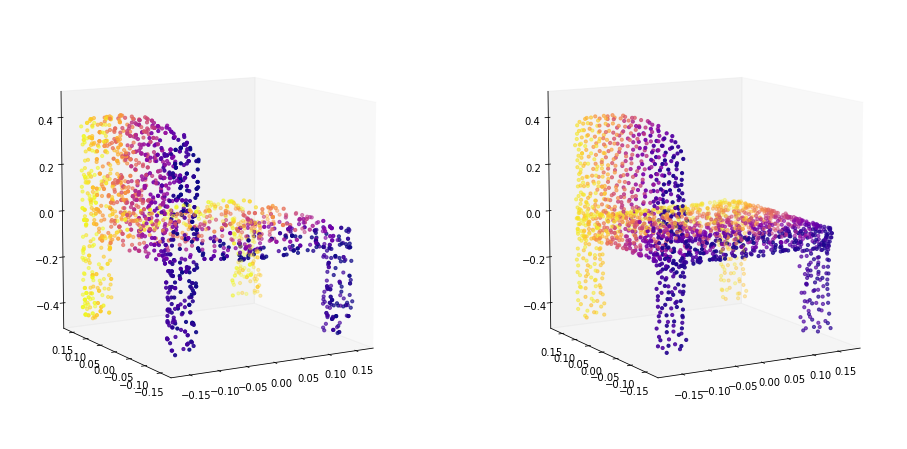

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

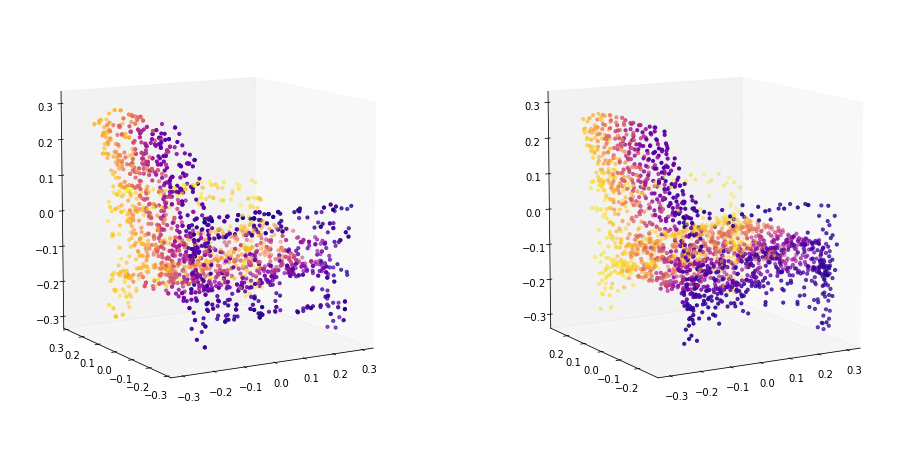

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

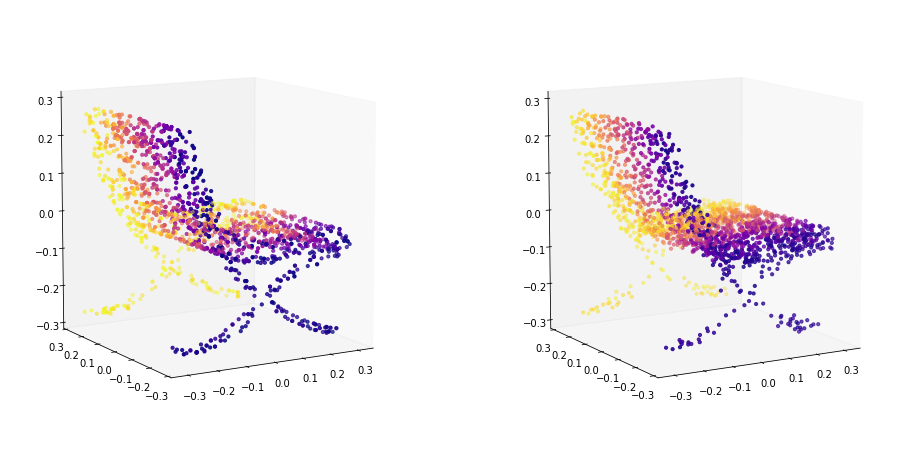

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

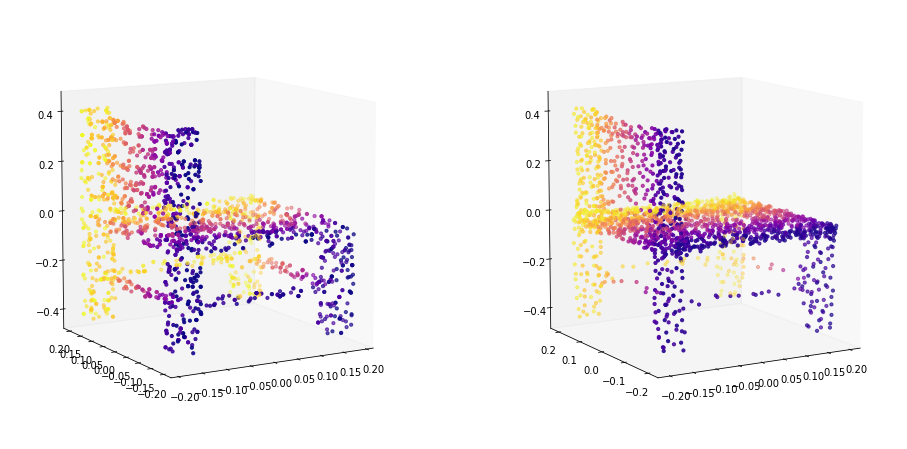

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
batch_idx, batch_data = next(enumerate(dataloader))
x = batch_data.pos.reshape(batch_size, n_points, 3).transpose(2, 1).to(device)

# reconstruct the samples:
x_hat = ae_model(x).cpu().detach().numpy()

x = x.cpu().detach().numpy()

print(x.shape)
print(x_hat.shape)


for i in range(batch_size):
  # visualize_points(gen_samples[i].transpose(1,0), is_shapenet=True)
  visualize_real_and_generated_samples([x[i].transpose(1,0), x_hat[i].transpose(1,0)], is_shapenet=True)

## The Latent GAN (l-GAN)

In [ ]:
class LatentGenerator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LatentGenerator, self).__init__()
        
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128), nn.ReLU(True),
            nn.Linear(128, output_dim), nn.ReLU(True)
        )
        
    def forward(self, x):        
        return self.model(x)
    
    def init_params(self, layer):
        if type(layer) == nn.Linear:
            nn.init.xavier_uniform_(layer.weight.data)
            nn.init.zeros_(layer.bias.data)

In [ ]:
class LatentDiscriminator(nn.Module):
    def __init__(self, in_dim=128):        
        super(LatentDiscriminator, self).__init__()
        
        self.decoder = nn.Sequential(
            nn.Linear(in_dim, 256), nn.ReLU(True),
            nn.Linear(256, 512), nn.ReLU(True),
            nn.Linear(512, 1), nn.Sigmoid(),
        )   

    def forward(self, x):
        x = self.decoder(x)
        return x
                        
    def init_params(self, layer):          
        if type(layer) == nn.Linear:
            nn.init.xavier_uniform_(layer.weight.data)
            nn.init.zeros_(layer.bias.data)

### Instantiate the l-GAN model

In [ ]:
# instantiate the l-GAN generator:
l_gan_gen_input_dim = 128
l_gan_gen_output_dim = 128 # equal to the output_dim of the encoder of the AE model

l_gan_gen = LatentGenerator(l_gan_gen_input_dim, l_gan_gen_output_dim).to(device)

# initialize the parameters:
l_gan_gen.apply(l_gan_gen.init_params)

mu = 0.
sigma = 0.2

z = torch.FloatTensor(1, l_gan_gen_input_dim).normal_(mu, sigma).to(device)

print(z.shape)
print(l_gan_gen(z).shape)

summary(l_gan_gen, (l_gan_gen_input_dim,))

# instantiate the l-GAN discriminator:
l_gan_dis_input_dim = 128
l_gan_dis = LatentDiscriminator(l_gan_dis_input_dim).to(device)

# initialize the parameters:
l_gan_dis.apply(l_gan_dis.init_params)

# print the summary:
y = torch.ones((1, l_gan_dis_input_dim)).to(device)
print(y.shape)

pred = l_gan_dis(y)
print(pred.shape)

summary(l_gan_dis, (l_gan_dis_input_dim,))

torch.Size([1, 128])
torch.Size([1, 128])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 128]          16,512
              ReLU-2                  [-1, 128]               0
            Linear-3                  [-1, 128]          16,512
              ReLU-4                  [-1, 128]               0
Total params: 33,024
Trainable params: 33,024
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.13
Estimated Total Size (MB): 0.13
----------------------------------------------------------------
torch.Size([1, 128])
torch.Size([1, 1])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 256]          33,024
              ReLU-2     

## Optimize the l-GAN

### Optimization setup

In [ ]:
# hyperparameters:
lr_gen = 1e-4
lr_dis = 1e-4
beta1 = 0.5
beta2 = 0.999

# two separate optimizers for the generator and discriminator:
optimizer_gen = optim.Adam(params=l_gan_gen.parameters(), 
                           lr=lr_gen, 
                           betas=(beta1, beta2))

optimizer_dis = optim.Adam(params=l_gan_dis.parameters(), 
                           lr=lr_dis, 
                           betas=(beta1, beta2))

# by supplying with the correct labels, we will make it 
# equivalent to using non-saturating heuristic for the generator
# and the standard binary cross-entropy for the discriminator
criterion = nn.BCELoss().to(device)

### Create a dataloader for for our single class dataset

(we will produce the encodings with the AE model inside the training loop)

In [ ]:
batch_size = 50
dataloader = DataLoader(dataset=single_class_data, 
                        batch_size=batch_size, 
                        shuffle=True,
                        drop_last=True)

print('Batch size: ', batch_size)
print('Number of batches:', len(dataloader))

Batch size:  50
Number of batches: 61


### Training loop

In [ ]:
epochs = 200
print_period = 10

losses_gen = []
losses_dis = []

for i in range(epochs):
    t0 = time.time()
    
    for batch_idx, batch_data in enumerate(dataloader):
        print(batch_idx, end='\r')
        batch_t0 = time.time()
        batch_size = batch_data.pos.shape[0] // n_points
        
        point_clouds = batch_data.pos.reshape(batch_size, n_points, 3).transpose(2, 1).to(device)
        
        # compute the encodings with the AE model:
        x = ae_model.encoder(point_clouds)
        # compute the max here (due to the specifics of our implementation):
        x = torch.max(x, dim=-1)[0].detach() # (batch_size x l_gan_gen_input_dim)
        
        # sample random vectors and generate samples from them:
        z = torch.FloatTensor(batch_size, l_gan_gen_input_dim).normal_(mu, sigma).to(device)
        gen_samples = l_gan_gen(z)
        
        # get the discriminator output for the two types of input:
        prob_x = l_gan_dis(x)
        prob_gen_samples = l_gan_dis(gen_samples)
        
        # the target probabilities:
        prob_real = torch.ones((batch_size, 1)).to(device)
        prob_fake = torch.zeros((batch_size, 1)).to(device)
        
        # the non-saturating heuristic loss for the generator:
        loss_gen = criterion(prob_gen_samples, prob_real)
        
        # compute the gradient of the loss_gen wrt the generator parameters:
        optimizer_gen.zero_grad()
        loss_gen.backward(retain_graph=True)
        
        # update the generator parameters:
        optimizer_gen.step()
        losses_gen.append(loss_gen.item())
                
        # the usual (binary cross-entropy) loss for the discriminator:
        loss_dis_real_term = criterion(prob_x, prob_real)
        loss_dis_fake_term = criterion(l_gan_dis(gen_samples.detach()), prob_fake)
        loss_dis = loss_dis_real_term + loss_dis_fake_term
        
        # compute the gradient and update the discriminator parameters:
        optimizer_dis.zero_grad()
        loss_dis.backward()
        optimizer_dis.step()
        losses_dis.append(loss_dis.item())
        
        if batch_idx % print_period == 0:
            print('ETA: %.5f, epoch: %d/%d, batch: %d/%d, loss_gen: %.3f, loss_dis: %.3f'
              % (time.time() - batch_t0, i+1, epochs, batch_idx, len(dataloader), torch.mean(torch.FloatTensor(losses_gen)), torch.mean(torch.FloatTensor(losses_dis)))
            )
            
    print('ETA: %.5f' % (time.time() - t0), end='\n\n')   

ETA: 0.05261, epoch: 1/200, batch: 0/61, loss_gen: 0.698, loss_dis: 1.503
ETA: 0.03045, epoch: 1/200, batch: 10/61, loss_gen: 0.679, loss_dis: 1.223
ETA: 0.02777, epoch: 1/200, batch: 20/61, loss_gen: 0.670, loss_dis: 1.084
ETA: 0.02841, epoch: 1/200, batch: 30/61, loss_gen: 0.673, loss_dis: 1.000
ETA: 0.02826, epoch: 1/200, batch: 40/61, loss_gen: 0.683, loss_dis: 0.940
ETA: 0.02814, epoch: 1/200, batch: 50/61, loss_gen: 0.700, loss_dis: 0.891
ETA: 0.02780, epoch: 1/200, batch: 60/61, loss_gen: 0.721, loss_dis: 0.849
ETA: 3.04142

ETA: 0.02770, epoch: 2/200, batch: 0/61, loss_gen: 0.723, loss_dis: 0.845
ETA: 0.02818, epoch: 2/200, batch: 10/61, loss_gen: 0.746, loss_dis: 0.808
ETA: 0.02848, epoch: 2/200, batch: 20/61, loss_gen: 0.770, loss_dis: 0.776
ETA: 0.02877, epoch: 2/200, batch: 30/61, loss_gen: 0.794, loss_dis: 0.747
ETA: 0.02891, epoch: 2/200, batch: 40/61, loss_gen: 0.820, loss_dis: 0.720
ETA: 0.02866, epoch: 2/200, batch: 50/61, loss_gen: 0.846, loss_dis: 0.695
ETA: 0.02791,

## Save the model

In [ ]:
torch.save(
    {
      'l_gan_generator': l_gan_gen.state_dict(),
      'l_gan_discriminator': l_gan_dis.state_dict()
    },
    shape_name + '_l_gan.tar'
    )


In [ ]:
loaded_model = torch.load(shape_name + '_l_gan.tar', map_location=device)
loaded_model.keys()

dict_keys(['l_gan_generator', 'l_gan_discriminator'])

### Generate samples

(50, 3, 2048)
(50, 3, 2048)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


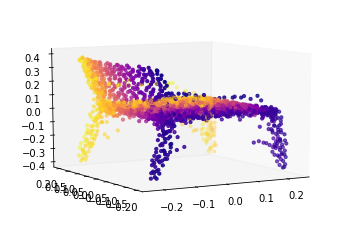

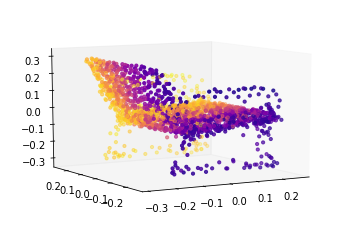

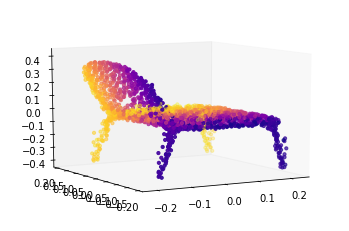

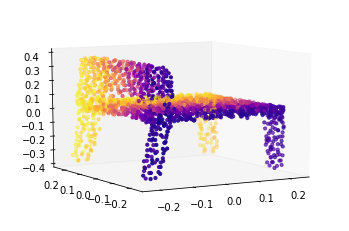

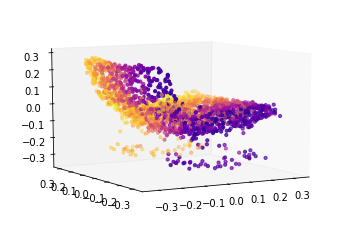

...

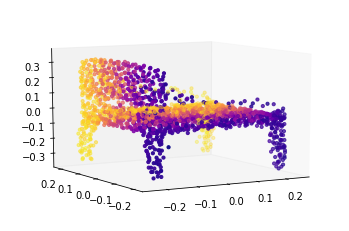

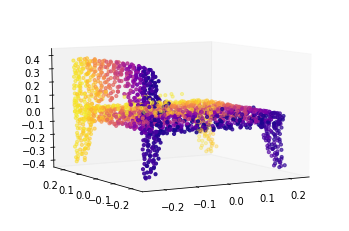

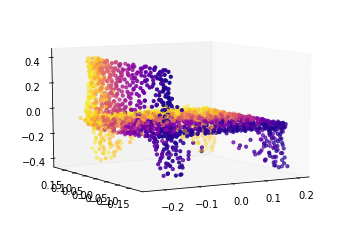

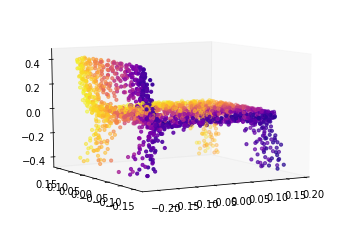

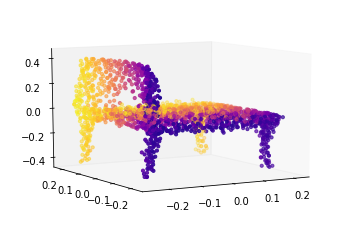

In [ ]:
batch_idx, batch_data = next(enumerate(dataloader))
x = batch_data.pos.reshape(batch_size, n_points, 3).transpose(2, 1).cpu().detach().numpy()

# sample the noise vector:
z = torch.Tensor(batch_size, l_gan_gen_input_dim).normal_(mu, sigma).to(device)

latent_samples = l_gan_gen(z)
gen_samples = ae_model.decoder(latent_samples).view(batch_size, 3, -1).cpu().detach().numpy()

print(x.shape)
print(gen_samples.shape)

for i in range(batch_size):
  visualize_points(gen_samples[i].transpose(1,0), is_shapenet=True)
  # visualize_real_and_generated_samples([x[i].transpose(1,0), gen_samples[i].transpose(1,0)], is_shapenet=True)